# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="https://github.com/hse-aml/intro-to-dl-pytorch/blob/main/week06/images/encoder_decoder.png?raw=1" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

Alright, here's our plan:
* Take a pre-trained inception v3 to vectorize images
* Stack an LSTM on top of it
* Train the thing on MSCOCO

## Importing stuff and preparing data

In [1]:
%%bash

shred -u setup_colab.py

wget https://raw.githubusercontent.com/hse-aml/intro-to-dl-pytorch/main/utils/setup_colab.py -O setup_colab.py

--2021-04-13 23:07:44--  https://raw.githubusercontent.com/hse-aml/intro-to-dl-pytorch/main/utils/setup_colab.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1649 (1.6K) [text/plain]
Saving to: ‘setup_colab.py’

     0K .                                                     100% 15.6M=0s

2021-04-13 23:07:44 (15.6 MB/s) - ‘setup_colab.py’ saved [1649/1649]



In [2]:
import setup_colab

setup_colab.setup_week06()

In [3]:
import grading
import grading_utils

grader = grading.Grader(
    assignment_key="NEDBg6CgEee8nQ6uE8a7OA",
    all_parts=["19Wpv", "E2OIL", "rbpnH", "YJR7z"]
)

In [4]:
# token expires every 30 min
COURSERA_TOKEN = "QVgvhvLxIHA4aauZ"
COURSERA_EMAIL = "fancycreative246@gmail.com"

In [4]:
%%time

# Load dataset (vectorized images and captions)
import numpy as np
import json

img_codes = np.load("data/image_codes.npy")
captions = json.load(open('data/captions_tokenized.json'))

CPU times: user 230 ms, sys: 504 ms, total: 734 ms
Wall time: 738 ms


In [5]:
print("Each image code is a 2048-unit vector [ shape: %s ]" % str(img_codes.shape))
print(img_codes[0,:10], end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 2048-unit vector [ shape: (118287, 2048) ]
[0.3659946  0.2016555  0.9245725  0.57063824 0.547268   0.8275868
 0.3687277  0.12085301 0.0561931  0.49758485]

For each image there are 5 reference captions, e.g.:

people shopping in an open market for vegetables .
an open market full of people and piles of vegetables .
people are shopping at an open air produce market .
large piles of carrots and potatoes at a crowded outdoor market .
people shop for vegetables like carrots and potatoes at an open air market .


As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [6]:
# split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"] + sentence.split(' ') + ["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

We want you to count the occurences of each word so that we can decide which words to keep in our vocabulary.

In [7]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()
tokens = []

# Compute word frequencies for each word in captions. See code above for data structure

# YOUR CODE HERE
for img_i in range(len(captions)):
  for caption_i in range(len(captions[img_i])):
    tokens += captions[img_i][caption_i]

word_counts = Counter(tokens)

In [8]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [9]:
for i, word in enumerate(vocab):
  if word == '#START#':
    print(i, word)

1 #START#


In [ ]:
vocab[1]

'#START#'

In [9]:
print([
        len(vocab),
        len(np.unique(vocab)),
    ])

[10403, 10403]


In [10]:
## GRADED PART, DO NOT CHANGE!
grader.set_answer("19Wpv", grading_utils.test_vocab(vocab))

In [ ]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


In [11]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [12]:
# Try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   24,  262,  140,    6,  159,   14,   24,  858,  155,   12,
           2,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   53,   18,   24,  858,  155,    2,    3,    3,
           3,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   41,   18,  903,   35,  620,  155,    2,    3,
           3,    3,    3,    3,    3,    3,    3,    3],
       [   1,   45,  115,  262,   41,   53,   18,  620, 1525,   77,   12,
           2,    3,    3,    3,    3,    3,    3,    3],
       [   1,   24,  262,   53,   18,   24,  858,  123,   58,   45,  276,
        3641,   24, 3642,   35,   45, 1128,   12,    2]], dtype=int32)

## Building our neural network
As we mentioned earlier, we shall build an rnn "language-model" conditioned on vectors from the convolutional part.

<img src="https://github.com/yunjey/pytorch-tutorial/raw/master/tutorials/03-advanced/image_captioning/png/model.png" style="width:70%">

In [13]:
import torch
from torch import nn
import torch.nn.functional as F

In [14]:
class CaptionNet(nn.Module):
    
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_feature_size=2048):
        """ A recurrent 'head' network for image captioning. See scheme above. """
        super().__init__()
        
        # a layer that converts conv features to initial_h (h_0) and initial_c (c_0)
        self.cnn_to_h0 = nn.Linear(cnn_feature_size, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_feature_size, lstm_units)

        # create embedding for input words. Use the parameters (e.g. emb_size).
        # YOUR CODE HERE
        self.emb = nn.Embedding(n_tokens, emb_size)
            
        # lstm: create a recurrent core of your network. Use either LSTMCell or just LSTM. 
        # In the latter case (nn.LSTM), make sure batch_first=True
        # YOUR CODE HERE
        self.lstm = nn.LSTM(emb_size, lstm_units, batch_first = True)
        self.rnn_to_logits = nn.Linear(lstm_units, n_tokens)
            
        # create logits: linear layer that takes lstm hidden state as input and computes one number per token
        # YOUR CODE HERE

        
    def forward(self, image_vectors, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_vectors: torch tensor containing inception vectors. shape: [batch, cnn_feature_size]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """

        self.lstm.flatten_parameters()

        initial_cell = self.cnn_to_c0(image_vectors)
        initial_hid = self.cnn_to_h0(image_vectors)
        
        # compute embeddings for captions_ix
        # YOUR CODE HERE
        captions_emb = self.emb(captions_ix)
        
        # apply recurrent layer to captions_emb. 
        # 1. initialize lstm state with initial_* from above
        # 2. feed it with captions. Mind the dimension order in docstring
        # 3. compute logits for next token probabilities
        # Note: if you used nn.LSTM, you can just give it (initial_cell[None], initial_hid[None]) as second arg
        (lstm_out, hidden)  = self.lstm(captions_emb, (initial_hid[None], initial_cell[None]))
        logits = self.rnn_to_logits(lstm_out)

        # lstm_out should be lstm hidden state sequence of shape [batch, caption_length, lstm_units]
        # YOUR CODE HERE
        
        # compute logits from lstm_out
        # YOUR CODE HERE
        return logits

In [15]:
network = CaptionNet(n_tokens)

In [16]:
dummy_img_vec = torch.randn(len(captions[0]), 2048)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits = network.forward(dummy_img_vec, dummy_capt_ix)

print('shape:', dummy_logits.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)

shape: torch.Size([5, 16, 10403])


In [19]:
print(pad_ix)

3


In [17]:
def compute_loss(network, image_vectors, captions_ix):
    """
    :param image_vectors: torch tensor containing inception vectors. shape: [batch, cnn_feature_size]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones. Scalar float tensor
    """
    criterion = nn.CrossEntropyLoss(ignore_index=pad_ix)
    
    # captions for input - all except last because we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions for captions_ix_next
    logits_for_next = network.forward(image_vectors, captions_ix_inp)
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask!
    # Make sure that predicting next tokens after EOS do not contribute to loss
    # You can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    # captions_ix_next = captions_ix_next*(captions_ix_next != pad_ix)
    batch_size, caption_len = captions_ix_next.size()

    loss = criterion(logits_for_next.view(batch_size*caption_len, -1), captions_ix_next.view(batch_size*caption_len))
    return loss
    # YOUR CODE HERE

In [18]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.data.numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
    'loss should depend differentiably on all neural network weights'

In [19]:
## GRADED PART, DO NOT CHANGE!
grader.set_answer("rbpnH", grading_utils.test_network(network))

In [ ]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


## Batch generator

In [20]:
from sklearn.model_selection import train_test_split

captions = np.array(captions)
train_img_codes, val_img_codes, train_captions, val_captions = train_test_split(
    img_codes, captions, test_size=0.1, random_state=42
)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  This is separate from the ipykernel package so we can avoid doing imports until


In [36]:
len(train_img_codes)

106458

In [21]:
from random import choice

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    # sample random numbers for image/caption indicies
    random_image_ix = np.random.randint(0, len(img_codes), size=batch_size)
    
    # get images
    batch_images = img_codes[random_image_ix]
    
    # 5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    # pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    # convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), \
        torch.tensor(batch_captions_ix, dtype=torch.int64)

In [22]:
generate_batch(img_codes, captions, 3)

(tensor([[0.1222, 0.4476, 0.3532,  ..., 0.3250, 0.1650, 0.0126],
         [0.4477, 0.1494, 0.3018,  ..., 0.0509, 0.6449, 0.4818],
         [0.2889, 0.1134, 0.2624,  ..., 0.0922, 0.2436, 0.0516]]),
 tensor([[   1,    4,   56,   17,   35,   37,   35,   45,   36,   12,    2,    3,
             3],
         [   1,   24,   29,   78,   24,  110,  327,  590,  404,  362, 3589,   12,
             2],
         [   1,   24, 4051, 1202,   10,   24,   87,    6,   24, 1574, 1106,   12,
             2]]))

In [23]:
## GRADED PART, DO NOT CHANGE!
grader.set_answer("E2OIL", grading_utils.test_batch(generate_batch(img_codes, captions, 3)))

In [ ]:
# you can make submission with answers so far to check yourself at this stage
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

TypeError: ignored

## Train and validate loop

In [24]:
from tqdm import tqdm_notebook
from IPython.display import clear_output
from tqdm import tqdm

In [25]:
DEVICE = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

In [26]:
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 100
n_batches_per_epoch = 50
n_validation_batches = 5  # how many batches are used for validation after each epoch

In [27]:
for epoch in range(n_epochs):
    
    train_loss = 0
    network.train()
    for _ in tqdm(range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        #clear old gradients
        optimizer.zero_grad()
        #backward pass
        loss_t.backward()
        #train opt
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    clear_output()
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")


Epoch: 99, train loss: 2.4918580532073973, val loss: 2.6125881671905518
Finished!


In [25]:
## GRADED PART, DO NOT CHANGE!
grader.set_answer("YJR7z", val_loss)

NameError: ignored

In [33]:
grader.submit(COURSERA_EMAIL, COURSERA_TOKEN)

Submitted to Coursera platform. See results on assignment page!


## Generating caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [28]:
from beheaded_inception3 import beheaded_inception_v3

inception = beheaded_inception_v3().eval()

def generate_caption(network, image, caption_prefix = ('#START#',), t=1, sample=True, max_len=100):
    network = network.cpu().eval()

    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >= 0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_8x8, vectors_neck, logits = inception(image[None])
    caption_prefix = list(caption_prefix)
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        next_word_logits = network.forward(vectors_neck, prefix_ix)[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().numpy()
        
        assert len(next_word_probs.shape) == 1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word == '#END#':
            break

    return ' '.join(caption_prefix[1:-1])

/usr/local/lib/python3.7/dist-packages/torchvision/models/inception.py:82: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  ' due to scipy/scipy#11299), please set init_weights=True.', FutureWarning)
Downloading: "https://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-1a9a5a14.pth


In [29]:
import matplotlib.pyplot as plt
from skimage.transform import resize

# sample image
! wget https://avatars.mds.yandex.net/get-zen_doc/1578906/pub_5deb7d24a06eaf00af983448_5deb7d6643863f00ae06dc24/scale_1200 -O data/img.jpg

--2021-04-13 23:17:14--  https://avatars.mds.yandex.net/get-zen_doc/1578906/pub_5deb7d24a06eaf00af983448_5deb7d6643863f00ae06dc24/scale_1200
Resolving avatars.mds.yandex.net (avatars.mds.yandex.net)... 87.250.247.181, 87.250.247.184, 87.250.247.183, ...
Connecting to avatars.mds.yandex.net (avatars.mds.yandex.net)|87.250.247.181|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 127270 (124K) [image/jpeg]
Saving to: ‘data/img.jpg’

data/img.jpg        100%[===================>] 124.29K   218KB/s    in 0.6s    

2021-04-13 23:17:16 (218 KB/s) - ‘data/img.jpg’ saved [127270/127270]



a cat is sitting on a bench in front of a window .
a cat is sitting on a table with a cat .
a cat is sitting on a wooden table .
a cat is sitting on a table with a cat .
a cat is sitting on a table .


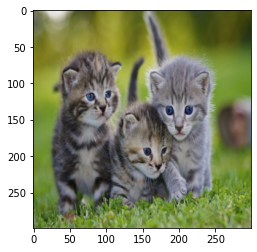

In [30]:
img = plt.imread('data/img.jpg')
img = resize(img, (299, 299))

plt.imshow(img)

for i in range(5):
    print(generate_caption(network, img, t=5.))

# Staff graded assignment tasks

Now you are going to train the network and estimate it's quality on checkpoints.

1. Train the network for 6 epoches (set n_batches_per_epoch to such value, that with batch_size you iterate over the whole dataset at one epoch, you should increase n_validation_batches to validate more accurately), find good and bad annotation examples. What loss values have you achieved?
1. Continue training until 12 epoch. What happened to the loss value? Search for examples, that have improved their captions in comparison to 6 epoch training.
1. Train the network until convergence. How many epoches do you need?
1. Mobile devices are not very powerfull. Try reducing network size (emb_size=64, lstm_units=128), how it affected network quality after 12 epoches in comparison to original network? And visually?
1. Collect at least 10 images that you like to test our network on.
    - Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
    - Make sure it works okay on simple images before going to something more complex
    - Photos, not animation/3d/drawings, unless you want to train CNN network on anime
    - Mind the aspect ratio
    - Photos should not be from MSCOCO! Collect some data yourself, take anything you find worth testing on

### Training tips

* If training loss has become close to 0 or model produces garbage, double-check that you're predicting next words, not current or t+2'th words
* If the model generates fluent captions that have nothing to do with the images
    * this may be due to recurrent net not receiving image vectors.
    * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
    * finally, you may just need to train the model a bit more
* Crossentropy is a poor measure of overfitting
    * Model can overfit validation crossentropy but keep improving validation quality.
    * Use human (manual) evaluation or try automated metrics: cider or bleu
    
* We recommend you to periodically evaluate the network using the next "apply trained model" block
    * its safe to interrupt training, run a few examples and start training again
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=2.8 ~ 3.0

## Images to test on

We have downloaded 30 images from validation set of MSCOCO, they are located in `data` folder and named `img_i.jpg` for i from 0 to 29. You should use them to measure your network quality during checkpoints.

In [45]:
### READ IMAGES FROM DISK
imgs = []

for i in range(30):
  img = plt.imread(f"data/img_{i}")
  img = resize(img, (299, 299))
  imgs.append(img)

## First task

Train the network for 6 epoches (set n_batches_per_epoch to such value, that with batch_size you iterate over the whole dataset at one epoch, you should increase n_validation_batches to validate more accurately), find good and bad annotation examples. What loss values have you achieved?

In [37]:
106458/128

831.703125

In [38]:
106458/128/6

138.6171875

In [39]:
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 6
n_batches_per_epoch = 139
n_validation_batches = 15  # how many batches are used for validation after each epoch

In [40]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)
### USE CODE FROM ABOVE (GENERATING CAPTION FOR IMAGES)
for epoch in range(n_epochs):
    
    train_loss = 0
    network.train()
    for _ in tqdm(range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        #clear old gradients
        optimizer.zero_grad()
        #backward pass
        loss_t.backward()
        #train opt
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    clear_output()
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")


Epoch: 5, train loss: 3.1667678476237566, val loss: 3.080991840362549
Finished!


In [44]:
len(imgs)

0

This is 1 image.


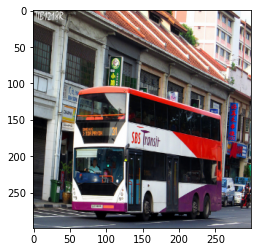

a bus is parked on a city street .
This is 2 image.


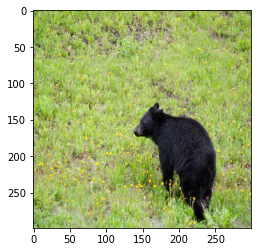

a large bear is in a field of a field .
This is 3 image.


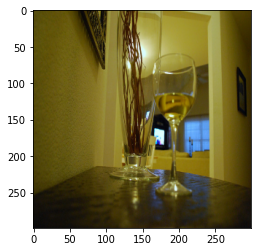

a table with a white plate with a knife and a cup of it .
This is 4 image.


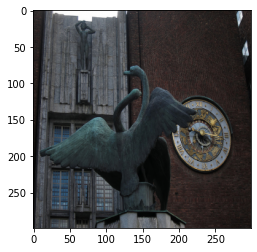

a cat sitting on a bench next to a table .
This is 5 image.


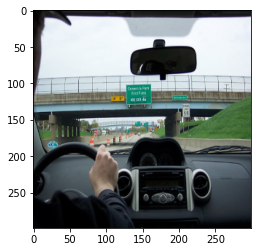

a person is a street sign in a city street .
This is 6 image.


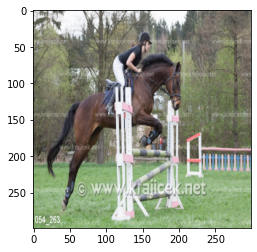

a woman is standing in a field with a horse .
This is 7 image.


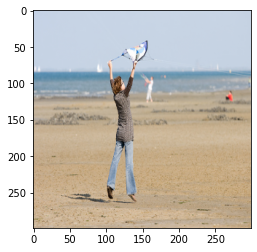

a man in a white shirt is holding a frisbee .
This is 8 image.


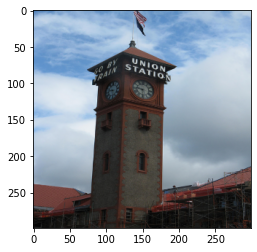

a clock tower with a clock on it .
This is 9 image.


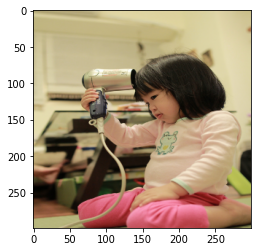

a woman sitting on a couch with a laptop .
This is 10 image.


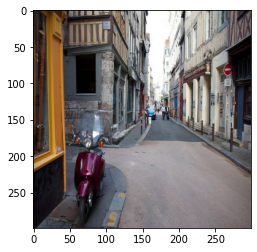

a city street with a clock on it .
This is 11 image.


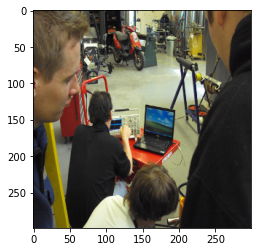

a man is sitting on a table with a laptop .
This is 12 image.


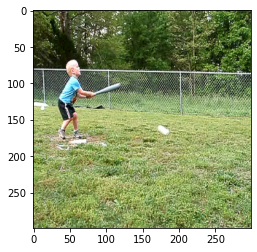

a man in a field with a frisbee .
This is 13 image.


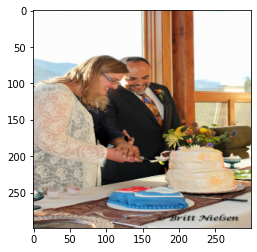

a woman sitting at a table with a table .
This is 14 image.


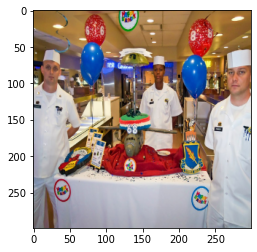

a man in a suit and a white shirt is holding a red and white shirt .
This is 15 image.


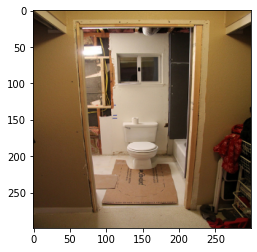

a bathroom with a toilet and a sink and a sink
This is 16 image.


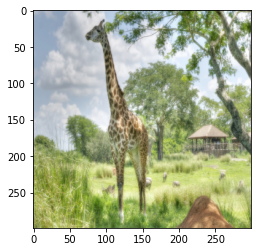

a giraffe standing in a field with a frisbee .
This is 17 image.


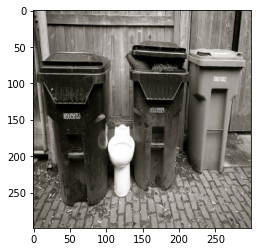

a white toilet with a white toilet and a white sink .
This is 18 image.


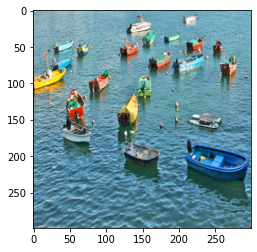

a group of people are standing in the water .
This is 19 image.


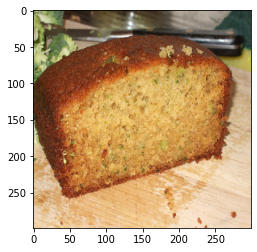

a white plate with a plate of food on it .
This is 20 image.


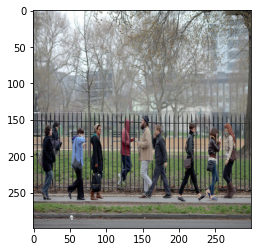

a group of people standing in a field of a field .
This is 21 image.


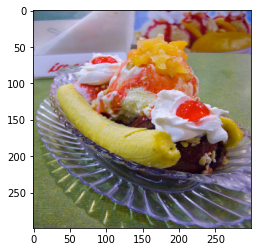

a plate of food on a plate with a sandwich .
This is 22 image.


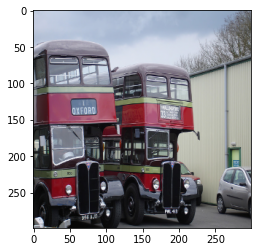

a bus parked on a city street with a bus and a bus .
This is 23 image.


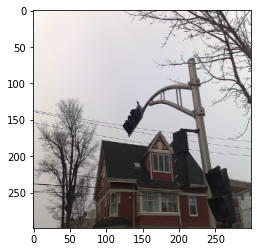

a clock tower with a clock on a pole .
This is 24 image.


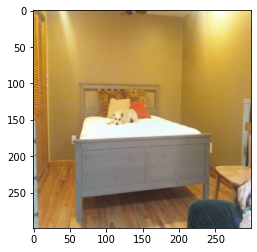

a small white toilet with a white toilet and a sink .
This is 25 image.


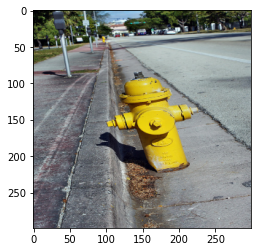

a red fire hydrant on a bench next to a building .
This is 26 image.


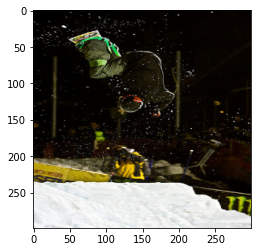

a man is riding a skateboard on a motorcycle .
This is 27 image.


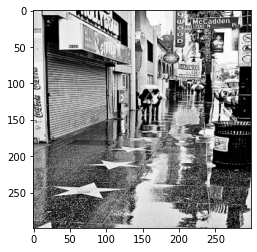

a man with a red fire hydrant on a street .
This is 28 image.


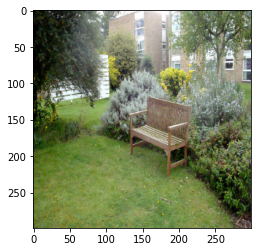

a bench in a field with a dog in the background .
This is 29 image.


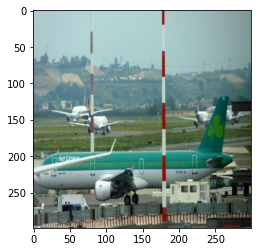

a small airplane is flying through the air .
This is 30 image.


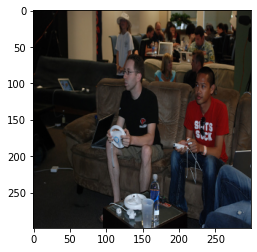

a man is holding a cell phone on a table .


In [46]:
for i in range(len(imgs)):
    img = imgs[i]
    print(f"This is {i+1} image.")
    plt.imshow(img)
    plt.show()
    print(generate_caption(network, img, t=5.))

## Second task

Continue training until 12 epoch. What happened to the loss value? Search for examples, that have improved their captions in comparison to 6 epoch training.

Task 1:
train loss: 3.1667678476237566, val loss: 3.080991840362549

Good Annotations:
1, 2, 6, 8, 11, 15, 16, 17, 18, 20, 21, 22, 25, 26, 27, 29, 
Bad Annotations:
3, 4, 5, 7, 9, 10, 12, 13, 14, 19, 23, 24, 28, 30


In [47]:
106458/128/12

69.30859375

In [48]:
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 12
n_batches_per_epoch = 70
n_validation_batches = 7  # how many batches are used for validation after each epoch

In [49]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)
### USE CODE FROM ABOVE (GENERATING CAPTION FOR IMAGES)
for epoch in range(n_epochs):
    
    train_loss = 0
    network.train()
    for _ in tqdm(range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        #clear old gradients
        optimizer.zero_grad()
        #backward pass
        loss_t.backward()
        #train opt
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    clear_output()
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")


Epoch: 11, train loss: 3.161855227606637, val loss: 3.217484167643956
Finished!


This is 1 image.


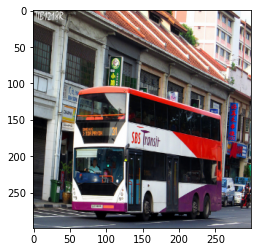

a bus with a red and white bus on a street .
This is 2 image.


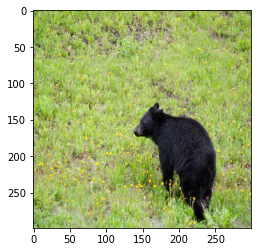

a black bear is standing in a field .
This is 3 image.


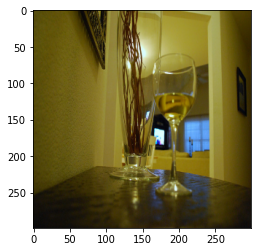

a table with a table with a sandwich and a fork .
This is 4 image.


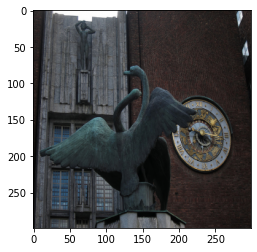

a black and white cat is sitting on a bench .
This is 5 image.


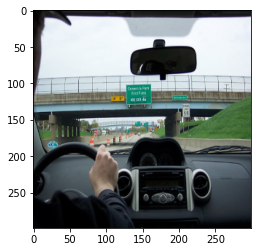

a large street sign with a stop sign on a street .
This is 6 image.


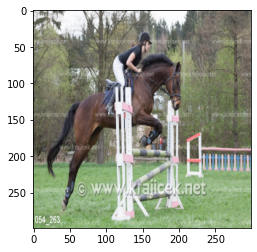

a man is standing on a field with a horse in the background .
This is 7 image.


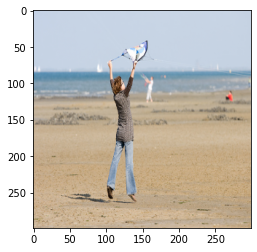

a man in a field with a kite on a beach .
This is 8 image.


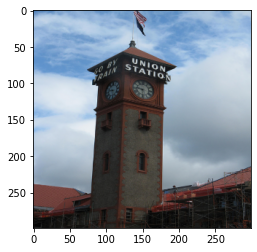

a clock tower with a clock on a building .
This is 9 image.


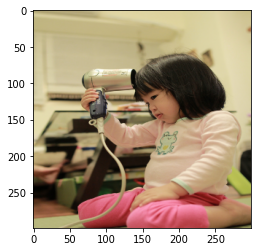

a woman holding a cell phone on a table .
This is 10 image.


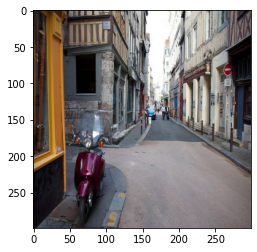

a black and white photo of a train is in a city street .
This is 11 image.


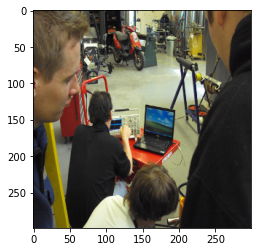

a man is holding a man holding a cell phone .
This is 12 image.


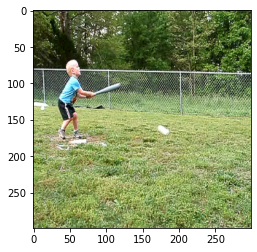

a man is standing in the middle of a field .
This is 13 image.


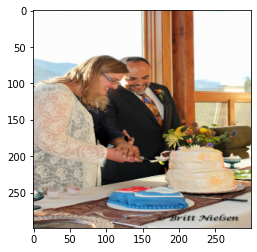

a man is holding a woman on a table .
This is 14 image.


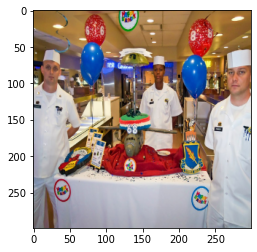

a man in a suit and a tie in a white shirt .
This is 15 image.


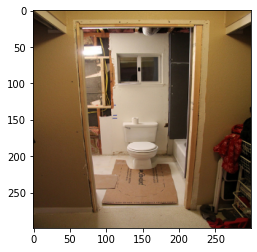

a bathroom with a sink and a sink .
This is 16 image.


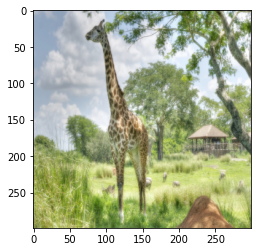

a giraffe standing in a field with a horse in the background .
This is 17 image.


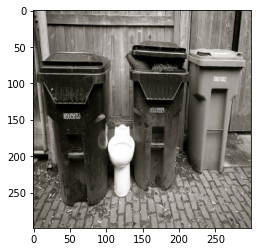

a white toilet and a white toilet in a mirror .
This is 18 image.


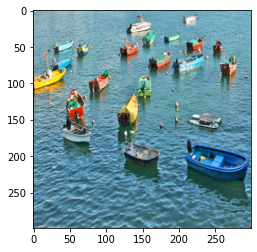

a person riding a surfboard on a beach .
This is 19 image.


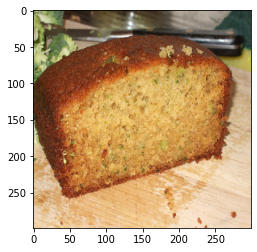

a plate of food on a plate with a plate .
This is 20 image.


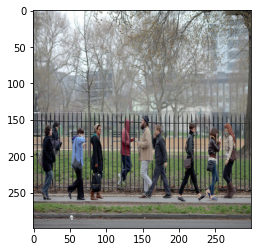

a group of people standing in a field with a dog in the background .
This is 21 image.


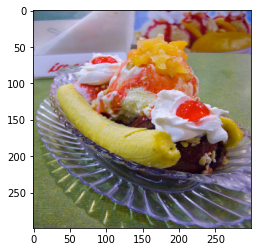

a plate of food with a sandwich and a plate .
This is 22 image.


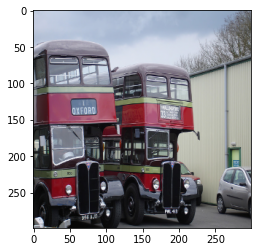

a bus driving down a street with a stop sign .
This is 23 image.


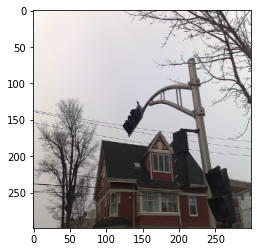

a clock tower with a clock on a city street .
This is 24 image.


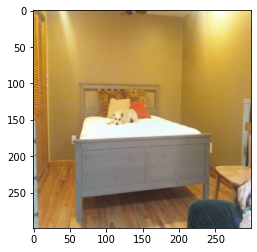

a bathroom with a white toilet and a sink .
This is 25 image.


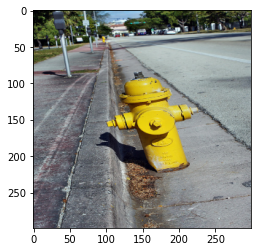

a large truck is sitting on a street .
This is 26 image.


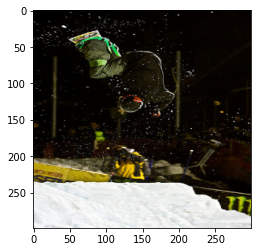

a man is standing on a snowy hill .
This is 27 image.


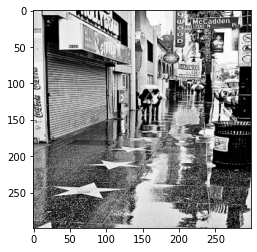

a man is standing on a street with a sign .
This is 28 image.


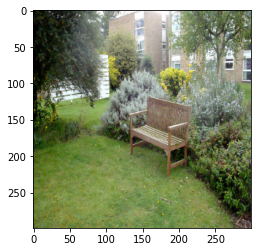

a bench with a large clock on the side of a road .
This is 29 image.


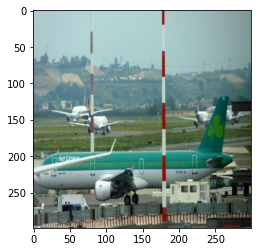

a large plane is sitting on the tracks .
This is 30 image.


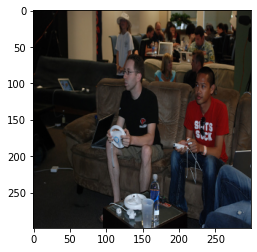

a woman is holding a woman holding a wii game .


In [50]:
for i in range(len(imgs)):
    img = imgs[i]
    print(f"This is {i+1} image.")
    plt.imshow(img)
    plt.show()
    print(generate_caption(network, img, t=5.))

Task 2: 
train loss: 3.161855227606637, val loss: 3.217484167643956
Good Annotations: 
1, 2, 7, 8, 11, 13, 14, 15, 16, 17, 21, 22, 24, 26, 27, 29, 30
Bad Annotations:
3, 4, 5, 6, 9, 10, 12, 18, 19, 20, 23, 25, 28
Improved Image Captions: 7, 9,10, 13, 14, 24, 30


## Third task

Train the network until convergence. How many epoches do you need?

In [56]:
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 500
n_batches_per_epoch = 5
n_validation_batches = 5  # how many batches are used for validation after each epoch

history = []


Epoch: 499, train loss: 2.6031093120574953, val loss: 2.7000614643096923


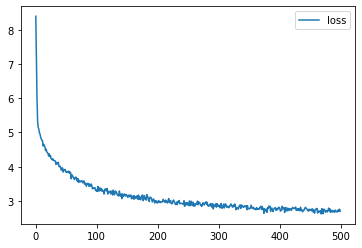

Finished!


In [57]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)
for epoch in range(n_epochs):
    
    train_loss = 0
    network.train()
    for _ in tqdm(range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        #clear old gradients
        optimizer.zero_grad()
        #backward pass
        loss_t.backward()
        #train opt
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    clear_output()
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))
    history.append(val_loss)
    if (epoch + 1) % 100 == 0:
        plt.plot(history,label='loss')
        plt.legend()
        plt.show()

print("Finished!")

We need about 150 epochs to make the training converge.

This is 1 image.


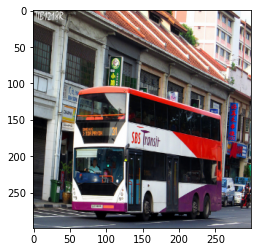

a bus is parked on the side of a street .
This is 2 image.


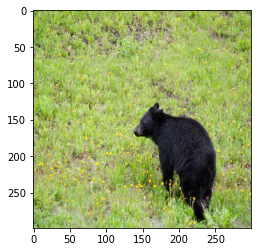

a bear is standing in a field .
This is 3 image.


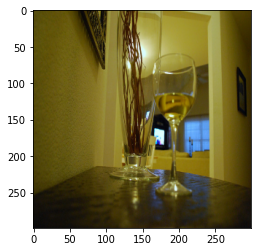

a glass vase with a glass of wine on it .
This is 4 image.


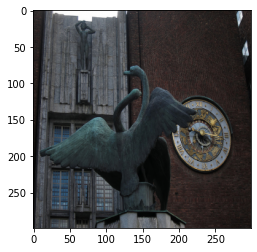

a person sitting on top of a wooden bench .
This is 5 image.


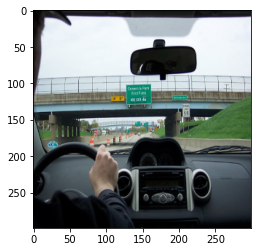

a parking meter is parked on a city street .
This is 6 image.


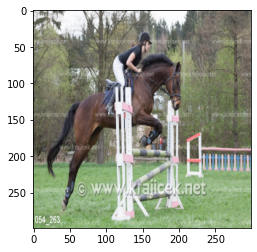

a horse is standing on a dirt road .
This is 7 image.


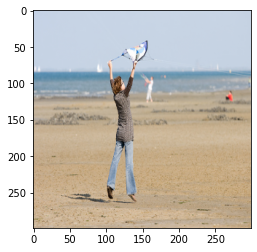

a man flying a kite in the air .
This is 8 image.


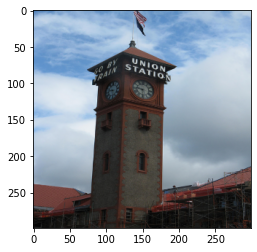

a clock tower with a clock on top of it .
This is 9 image.


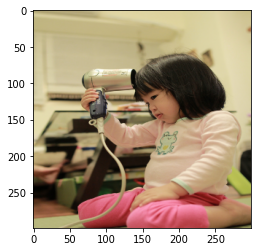

a woman sitting on a table with a remote .
This is 10 image.


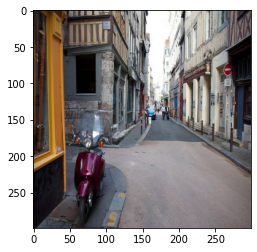

a man riding a bike down a street .
This is 11 image.


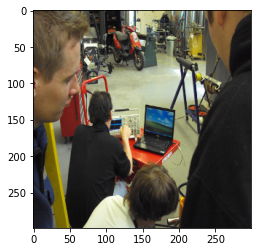

a group of people sitting at a table with laptops .
This is 12 image.


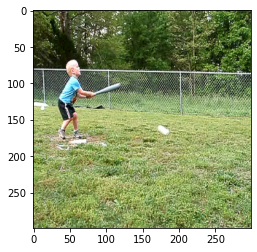

a man is playing frisbee in a field .
This is 13 image.


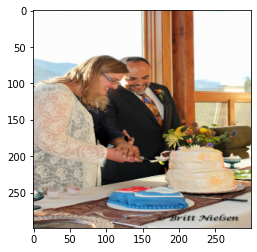

a woman sitting at a table with a cake .
This is 14 image.


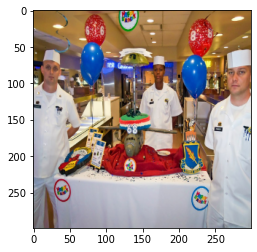

a group of people standing around a table with a cake .
This is 15 image.


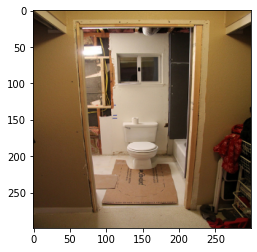

a bathroom with a toilet , sink and toilet .
This is 16 image.


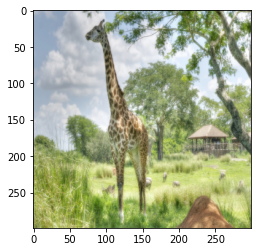

a giraffe standing in a field with trees in the background .
This is 17 image.


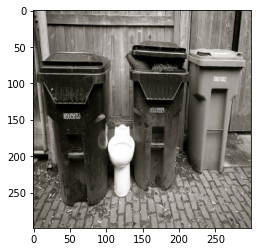

a white toilet sitting next to a white wall .
This is 18 image.


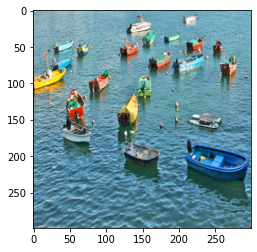

a group of people standing next to each other .
This is 19 image.


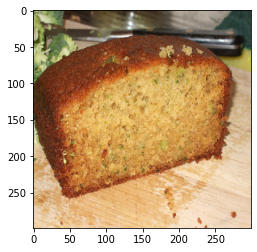

a piece of cake on a table with a knife .
This is 20 image.


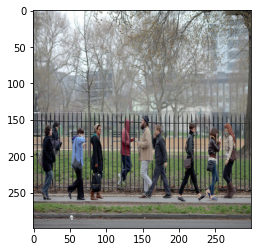

a group of people standing in a field with trees .
This is 21 image.


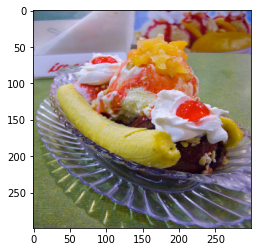

a plate with a sandwich and a sandwich
This is 22 image.


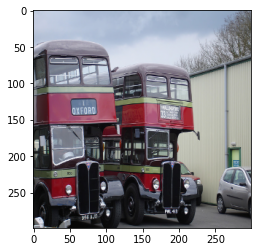

a bus is parked on the side of a road .
This is 23 image.


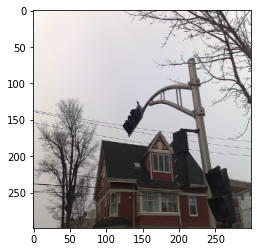

a clock tower with a clock on it .
This is 24 image.


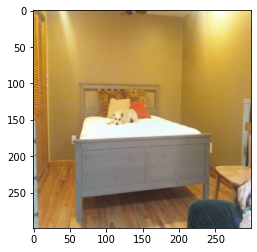

a small bathroom with a white toilet and a sink .
This is 25 image.


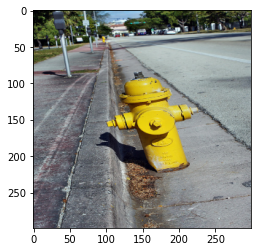

a fire hydrant sitting on a sidewalk next to a tree .
This is 26 image.


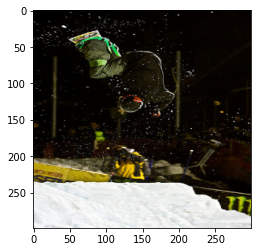

a person on a snowboard on a snowboard
This is 27 image.


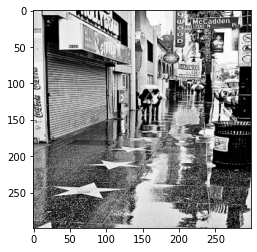

a street sign with a street sign on it
This is 28 image.


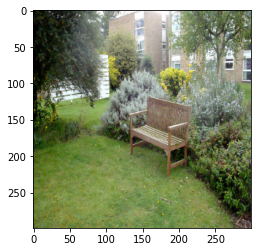

a bench sitting on top of a wooden bench .
This is 29 image.


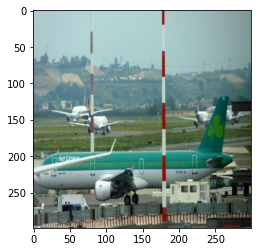

a plane is parked on the runway .
This is 30 image.


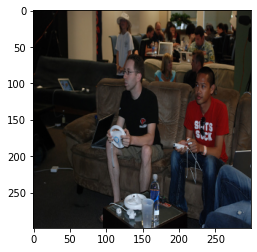

a group of people playing a video game .


In [58]:
for i in range(len(imgs)):
    img = imgs[i]
    print(f"This is {i+1} image.")
    plt.imshow(img)
    plt.show()
    print(generate_caption(network, img, t=5.))

## Fourth task

 Mobile devices are not very powerfull. Try reducing network size (emb_size=64, lstm_units=128), how it affected network quality after 12 epoches in comparison to original network? And visually?

In [75]:
network = CaptionNet(n_tokens,emb_size=64,lstm_units=128 ).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 12
n_batches_per_epoch = 70
n_validation_batches = 7  # how many batches are used for validation after each epoch

In [76]:
### USE CODE FROM ABOVE (MAIN TRAIN AND VAL LOOP)
### USE CODE FROM ABOVE (GENERATING CAPTION FOR IMAGES)
for epoch in range(n_epochs):
    
    train_loss = 0
    network.train()
    for _ in tqdm(range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        #clear old gradients
        optimizer.zero_grad()
        #backward pass
        loss_t.backward()
        #train opt
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    clear_output()
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")


Epoch: 11, train loss: 3.5096247979572843, val loss: 3.458589553833008
Finished!


This is 1 image.


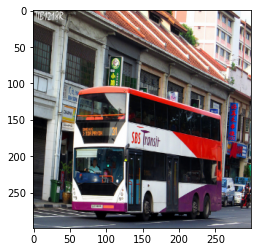

a bus is parked on a street .
This is 2 image.


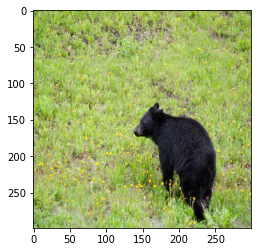

a large bear is standing in the water .
This is 3 image.


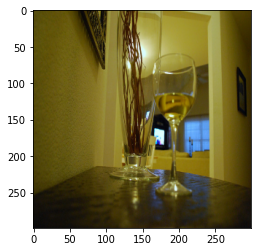

a small room with a table , and a white plate .
This is 4 image.


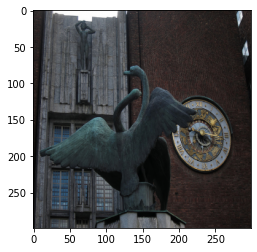

a man is holding a skateboard on a table .
This is 5 image.


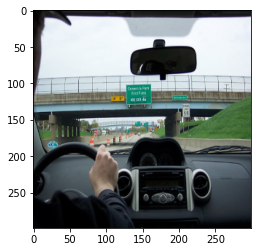

a person is standing on a bench next to a street .
This is 6 image.


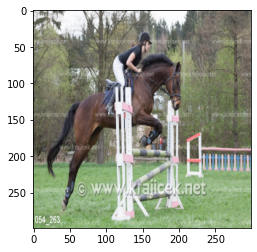

a man standing in a field with a large field .
This is 7 image.


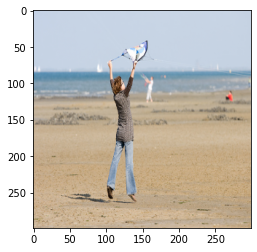

a man is standing on the beach with a tennis racket .
This is 8 image.


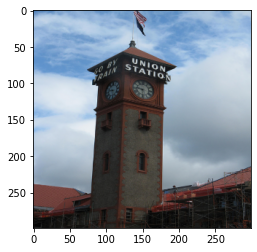

a clock tower with a building and a building .
This is 9 image.


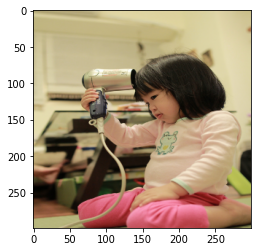

a woman is sitting on a bed with a laptop .
This is 10 image.


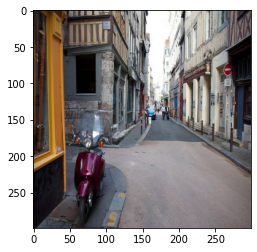

a group of people are on a table .
This is 11 image.


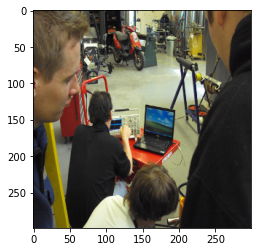

a man is holding a tennis racket on a table .
This is 12 image.


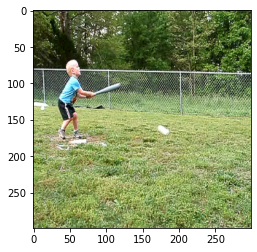

a man is playing a tennis court .
This is 13 image.


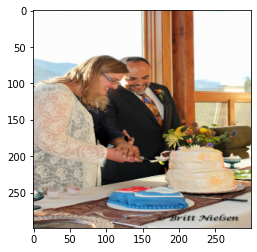

a man is standing in a table with a table .
This is 14 image.


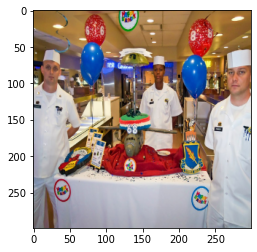

a man is standing in a room with a laptop .
This is 15 image.


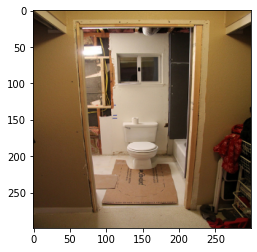

a bathroom with a toilet and a toilet .
This is 16 image.


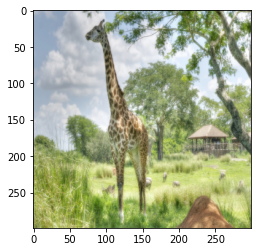

a giraffe is standing in a field of a field .
This is 17 image.


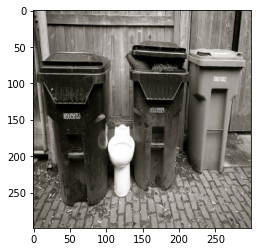

a white toilet is sitting on a table .
This is 18 image.


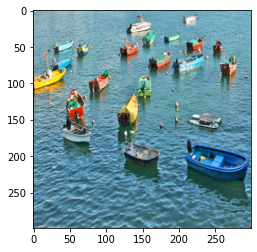

a group of people standing in the grass and a field .
This is 19 image.


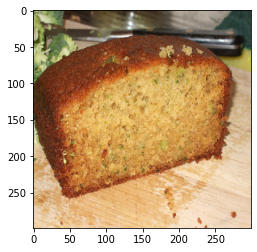

a plate of food on a table .
This is 20 image.


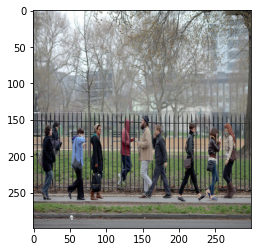

a group of people are standing in the grass .
This is 21 image.


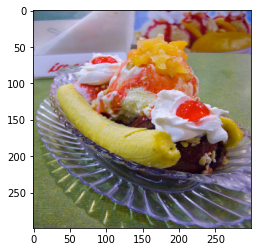

a pizza with a plate of food and a pizza .
This is 22 image.


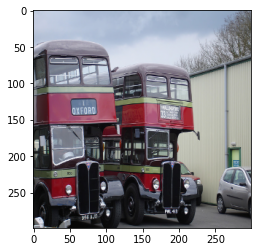

a bus is parked on the street .
This is 23 image.


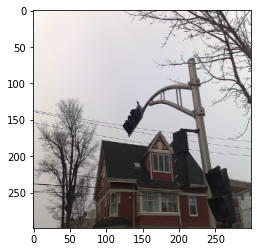

a street sign with a street sign on the street .
This is 24 image.


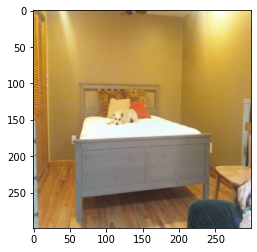

a white cat is sitting on a table .
This is 25 image.


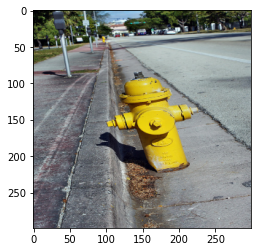

a red fire hydrant in a city street .
This is 26 image.


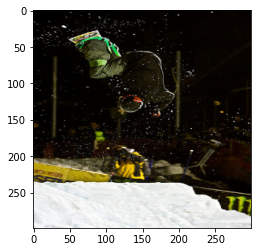

a man is standing on a bench with a large white plate .
This is 27 image.


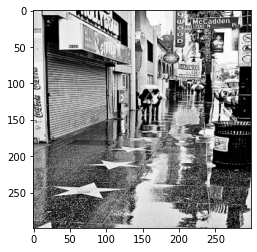

a street sign in a street sign .
This is 28 image.


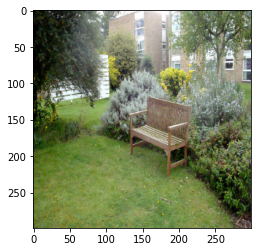

a bench with a large clock on the street .
This is 29 image.


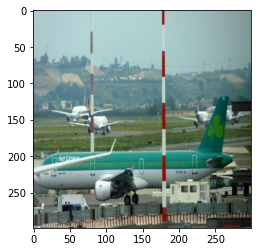

a large airplane is parked in the air .
This is 30 image.


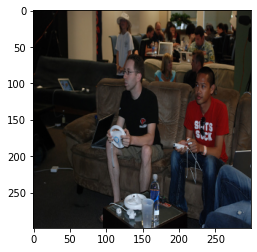

a man is sitting on a table with a laptop .


In [77]:
for i in range(len(imgs)):
    img = imgs[i]
    print(f"This is {i+1} image.")
    plt.imshow(img)
    plt.show()
    print(generate_caption(network, img, t=5.))

Task 4:
train loss: 3.5096247979572843, val loss: 3.458589553833008
Good Annotations:
1, 2, 3, 7, 8, 13, 15, 16, 17, 19, 20, 22, 25, 
Bad Annotations:
4, 5, 6, 9, 10, 11, 12, 14, 18, 21, 23, 24, 26, 27, 28, 29, 30

Compared to task 2, quality of image captions for some images decreased. The validation loss and training loss for smaller network size are less than the losses for network in taks 2.


## Fifth task

Collect at least 10 images that you like to test our network on.
   - Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
   - Make sure it works okay on simple images before going to something more complex
   - Photos, not animation/3d/drawings, unless you want to train CNN network on anime
   - Mind the aspect ratio
   - Photos should not be from MSCOCO! Collect some data yourself, take anything you find worth testing on

In [80]:
network = CaptionNet(n_tokens).to(DEVICE)
optimizer = torch.optim.Adam(network.parameters(), lr=1e-3)

batch_size = 128
n_epochs = 100
n_batches_per_epoch = 50
n_validation_batches = 5  # how many batches are used for validation after each epoch

In [81]:
for epoch in range(n_epochs):
    
    train_loss = 0
    network.train()
    for _ in tqdm(range(n_batches_per_epoch)):
        images, captions = generate_batch(train_img_codes, train_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)

        loss_t = compute_loss(network, images, captions)
        
        # clear old gradients; do a backward pass to get new gradients; then train with opt
        # YOUR CODE HERE
        #clear old gradients
        optimizer.zero_grad()
        #backward pass
        loss_t.backward()
        #train opt
        optimizer.step()
        
        train_loss += loss_t.detach().cpu().numpy()
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    network.eval()
    for _ in range(n_validation_batches):
        images, captions = generate_batch(val_img_codes, val_captions, batch_size)
        images = images.to(DEVICE)
        captions = captions.to(DEVICE)
        
        with torch.no_grad():
            loss_t = compute_loss(network, images, captions)

        val_loss += loss_t.detach().cpu().numpy()

    val_loss /= n_validation_batches
    
    clear_output()
    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

print("Finished!")


Epoch: 99, train loss: 2.4998182916641234, val loss: 2.6202837944030763
Finished!


In [78]:
### YOUR IMAGES COLLECTING CODE
### YOUR CAPTIONS GENERATING CODE
my_imgs = []

for i in range(1, 11):
  img = plt.imread(f"img{i}.jpg")
  img = resize(img, (299, 299, 3))
  my_imgs.append(img)

This is 1 image.


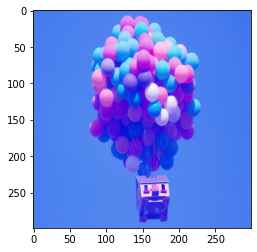

a vase of flowers in a vase .
This is 2 image.


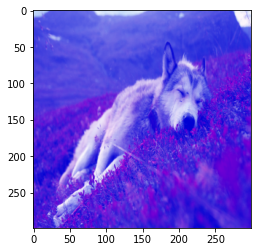

a dog is laying down on the ground .
This is 3 image.


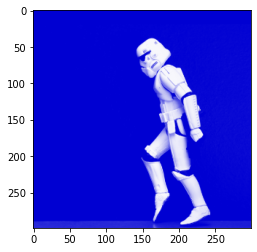

a woman in a red shirt and black pants
This is 4 image.


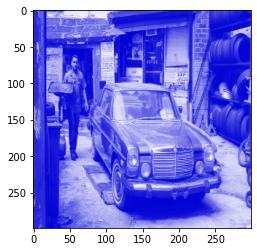

a man is sitting on a bench in a car .
This is 5 image.


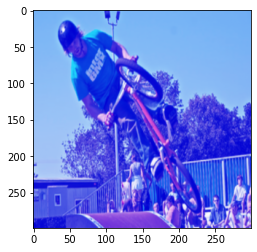

a man riding a motorcycle on a street .
This is 6 image.


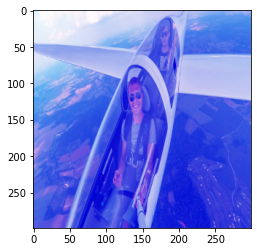

a person is flying a kite in the air .
This is 7 image.


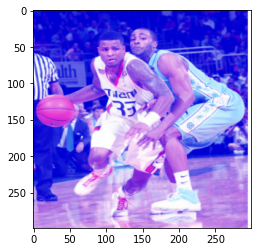

a man and woman standing on a bench with a frisbee .
This is 8 image.


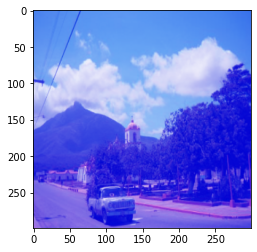

a man is flying a kite on a beach .
This is 9 image.


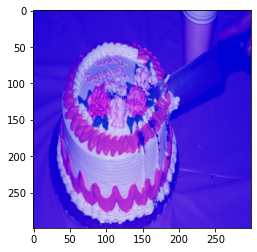

a cake with a knife and a knife .
This is 10 image.


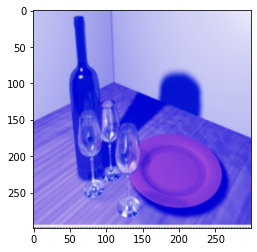

a white plate with a piece of coffee and a cup on it


In [82]:
for i in range(0, 10):
  img = my_imgs[i]
  print(f"This is {i+1} image.")
  plt.imshow(img)
  plt.show()
  print(generate_caption(network, img, t=5.))


In [68]:
print(generate_caption(network, img, t=5.))

a dog is laying on a bed with a white dog .
